In [1]:
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from wave_prop_module import Wave2d
from torch import optim
from unet import UNet
from loss_fns import *
import lpips

In [2]:
def get_sobel_kernel_x(k=15):
    # get range
    range = np.linspace(-(k // 2), k // 2, k)
    # compute a grid the numerator and the axis-distances
    x, y = np.meshgrid(range, range)
    sobel_2D_numerator = x
    sobel_2D_denominator = (x ** 2 + y ** 2)
    sobel_2D_denominator[:, k // 2] = 1  # avoid division by zero
    sobel_2D = sobel_2D_numerator / sobel_2D_denominator
    return sobel_2D

def get_sobel_kernel_y(k=15):
    # get range
    range = np.linspace(-(k // 2), k // 2, k)
    # compute a grid the numerator and the axis-distances
    x, y = np.meshgrid(range, range)
    sobel_2D_numerator = y
    sobel_2D_denominator = (x ** 2 + y ** 2)
    sobel_2D_denominator[:, k // 2] = 1  # avoid division by zero
    sobel_2D = sobel_2D_numerator / sobel_2D_denominator
    return sobel_2D

In [9]:
# complete model
device = torch.device('cuda:0')

model_amp = UNet(num_input_channels=1, num_output_channels=1).to(device) # postprocessor
model_phase = UNet(num_input_channels=1, num_output_channels=1).to(device) # postprocessor

# incident wave
X, Y = np.meshgrid(np.linspace(-1, 1, 1024), np.linspace(-1, 1, 1360))

A = torch.tensor([X.T.ravel(), Y.T.ravel(), X.T.ravel()*Y.T.ravel(), X.T.ravel()*X.T.ravel(), Y.T.ravel()*Y.T.ravel(), np.ones_like(X.T.ravel()), 
              (X.T.ravel())**3, (Y.T.ravel())**3, X.T.ravel()*(Y.T.ravel())**2, Y.T.ravel()*(X.T.ravel())**2], dtype=torch.float32).T


# coeffs = torch.rand(10, 1, requires_grad=True)
# coeffs = torch.FloatTensor(10, 1).uniform_(-1, 1)
coeffs = torch.tensor([[ -13.53], [-113.3250], [ -12.7425], [   4.4154], [   6.2158], 
                       [ -119.261], [   2.3329], [  1.3617], [   1.5364], [  3.5796]],
                       requires_grad=True)
# .float().to(device)
# coeffs.requires_grad=True

# obj_amp = torch.rand(1024, 1360, requires_grad=True)
obj_phase = torch.rand(1024, 1360, requires_grad=True)
obj_amp = torch.rand(1024, 1360, requires_grad=True)

phase_img = np.load('phase_0.npy')
abs_img = np.load('abs_0.npy')

target_phase = torch.tensor(phase_img).to(device)
target_abs = torch.tensor(abs_img).to(device)

# cons = torch.tensor(3.2, requires_grad=True)
# dist = torch.tensor(155.003, requires_grad=True) # mm 

# loss_fn_alex = lpips.LPIPS(net='alex') 

optimizer = optim.Adam([
    {'params': obj_phase, 'lr': 1e-1},
    {'params': obj_amp, 'lr': 1e-1},
    {'params': coeffs, 'lr': 1e-1}
    # {'params': cons, 'lr': 1e-2}
    # {'params': dist, 'lr': 1}
    ],
    lr=0.01, betas=(0.9, 0.999)
    )
optimizer_proc = optim.Adam([
    {'params': model_amp.parameters(), 'lr': 1e-3},
    {'params': model_phase.parameters(), 'lr': 1e-3}],
    lr=0.01, betas=(0.9, 0.999)
    )

wave_obj = Wave2d(
        numPx = list(obj_phase.shape), 
        sizePx = [6*1e-3, 6*1e-3], 
        wl = 550*1e-6
        )

In [10]:
# plt.imshow(target_phase.T)
# plt.colorbar()
# plt.show()

# plt.imshow(target_abs.T)
# plt.colorbar()
# plt.show()

# plt.imshow(obj_phase.detach())
# plt.colorbar()
# plt.show()

0 0.16046284227283292 155.0030059814453


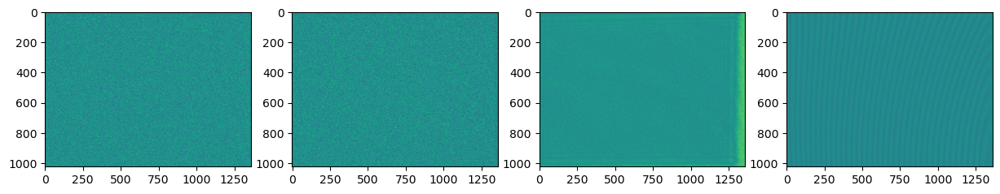

1 0.1599852674020939 155.0030059814453
2 0.15974051241804216 155.0030059814453
3 0.15946788162209624 155.0030059814453
4 0.15906182810893021 155.0030059814453
5 0.1584815375886478 155.0030059814453
6 0.15768747434937422 155.0030059814453
7 0.15663332620188075 155.0030059814453
8 0.1552517182195836 155.0030059814453
9 0.15343480170894175 155.0030059814453
10 0.15119803855717096 155.0030059814453


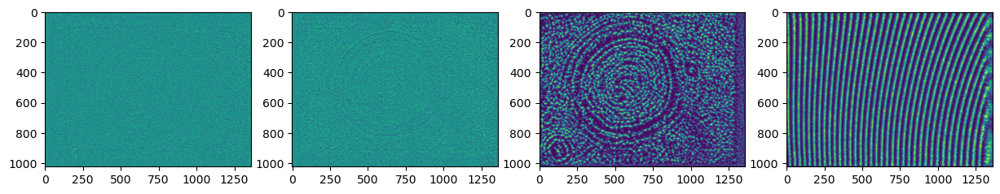

11 0.148653379461073 155.0030059814453
12 0.14655531941567917 155.0030059814453
13 0.14504788758302542 155.0030059814453
14 0.1444526413219183 155.0030059814453
15 0.14418516177764856 155.0030059814453
16 0.14364037480430483 155.0030059814453
17 0.14275620720818916 155.0030059814453
18 0.14148072330969344 155.0030059814453
19 0.14266640301930844 155.0030059814453
20 0.1408518627137662 155.0030059814453


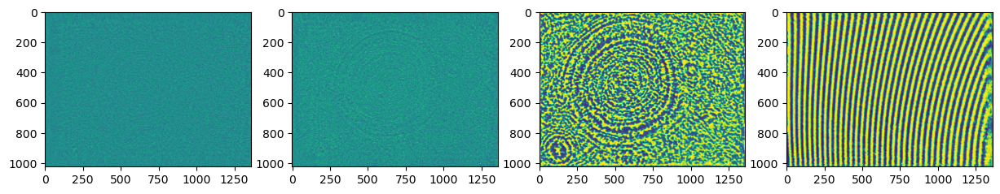

21 0.14036863328137741 155.0030059814453
22 0.13998668422266414 155.0030059814453
23 0.1392595592407056 155.0030059814453
24 0.13817958205827174 155.0030059814453
25 0.13690028240038252 155.0030059814453
26 0.13590186624951905 155.0030059814453
27 0.1351495418257553 155.0030059814453
28 0.13420263534190263 155.0030059814453
29 0.13352576433427787 155.0030059814453
30 0.13306237380642644 155.0030059814453


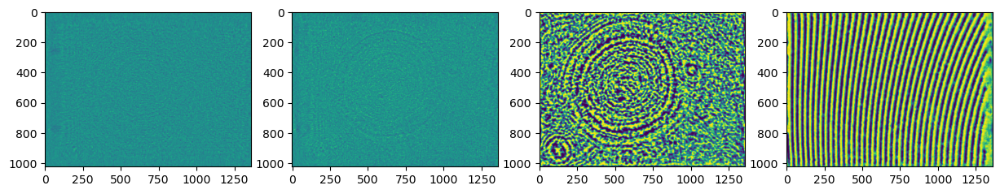

31 0.13280893443655076 155.0030059814453
32 0.1326572116595616 155.0030059814453
33 0.13247974785433722 155.0030059814453
34 0.13228849872706552 155.0030059814453
35 0.13209144781547819 155.0030059814453
36 0.13188514349506136 155.0030059814453
37 0.13170047025491932 155.0030059814453
38 0.13157222708781244 155.0030059814453
39 0.13146401161208687 155.0030059814453
40 0.13138252501148773 155.0030059814453


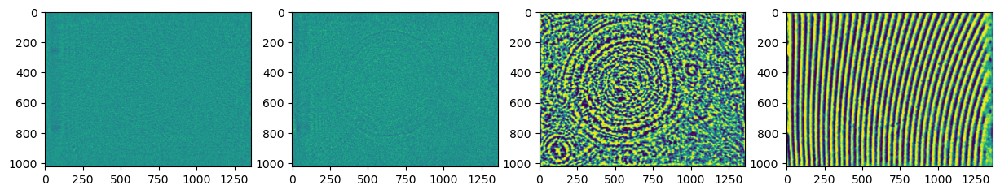

41 0.1312833661295994 155.0030059814453
42 0.13119171623832257 155.0030059814453
43 0.13114241088837977 155.0030059814453
44 0.13112304902379263 155.0030059814453
45 0.1310540820795011 155.0030059814453
46 0.1309024982136863 155.0030059814453
47 0.13081622844595128 155.0030059814453
48 0.13078939672727286 155.0030059814453
49 0.13073769769750915 155.0030059814453
50 0.13065962832522085 155.0030059814453


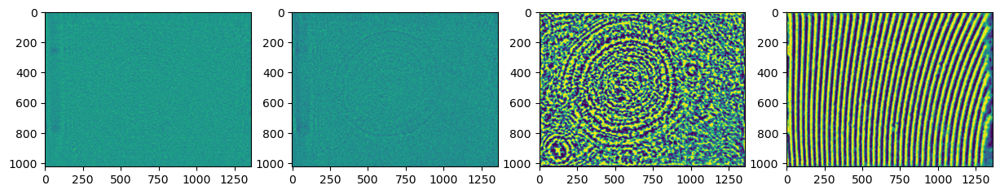

51 0.1306425217505574 155.0030059814453
52 0.13056604463160384 155.0030059814453
53 0.13050721272175686 155.0030059814453
54 0.13041996819497828 155.0030059814453
55 0.1303651273977323 155.0030059814453
56 0.13035400830977706 155.0030059814453
57 0.130322453873631 155.0030059814453
58 0.13033883559837003 155.0030059814453
59 0.13024845849954486 155.0030059814453
60 0.13017815281393227 155.0030059814453


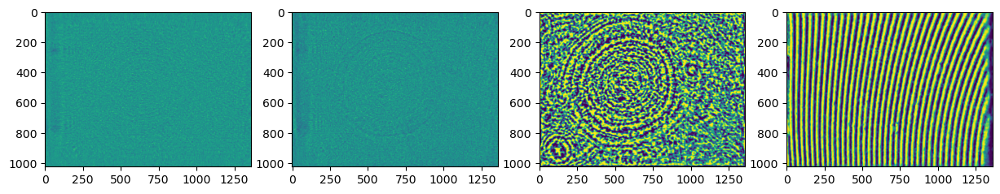

61 0.13013377124945394 155.0030059814453
62 0.13018968717743606 155.0030059814453
63 0.1303028465396659 155.0030059814453
64 0.13011441247189912 155.0030059814453
65 0.1299882734193005 155.0030059814453
66 0.13008224364086515 155.0030059814453
67 0.13005213087369033 155.0030059814453
68 0.1300553592054316 155.0030059814453
69 0.13001801945178434 155.0030059814453
70 0.13010922792909768 155.0030059814453


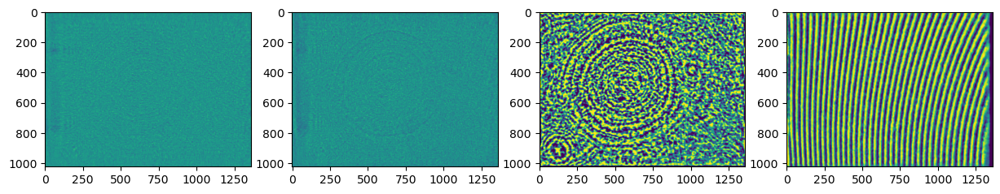

71 0.1299539202587942 155.0030059814453
72 0.12979333093159717 155.0030059814453
73 0.12982769861966098 155.0030059814453
74 0.1298082202229093 155.0030059814453
75 0.12976406881964897 155.0030059814453
76 0.1297795076364979 155.0030059814453
77 0.12991760406723443 155.0030059814453
78 0.12975352070658136 155.0030059814453
79 0.12966012141344535 155.0030059814453
80 0.12968651557598462 155.0030059814453


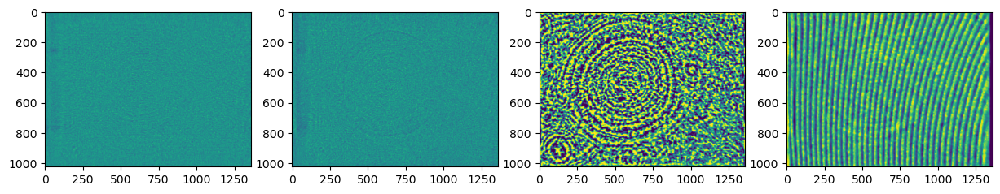

81 0.1295449880924753 155.0030059814453
82 0.12952203500633697 155.0030059814453
83 0.12959189426204074 155.0030059814453
84 0.1295957127644653 155.0030059814453
85 0.12951372072406514 155.0030059814453
86 0.1296803595215417 155.0030059814453
87 0.1296790478553969 155.0030059814453
88 0.1294120433801483 155.0030059814453
89 0.12937368516169248 155.0030059814453
90 0.12941702209868836 155.0030059814453


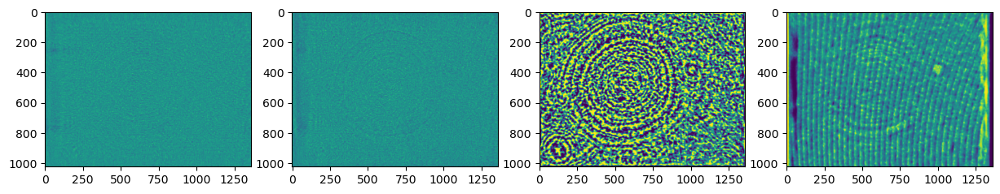

91 0.12932540764247746 155.0030059814453
92 0.1291578899994255 155.0030059814453
93 0.1291923838419595 155.0030059814453
94 0.12921892161070067 155.0030059814453
95 0.1291231482671239 155.0030059814453
96 0.12911001480010648 155.0030059814453
97 0.12911949304020515 155.0030059814453
98 0.12923160800244318 155.0030059814453
99 0.12920856396684238 155.0030059814453
100 0.12904283076526799 155.0030059814453


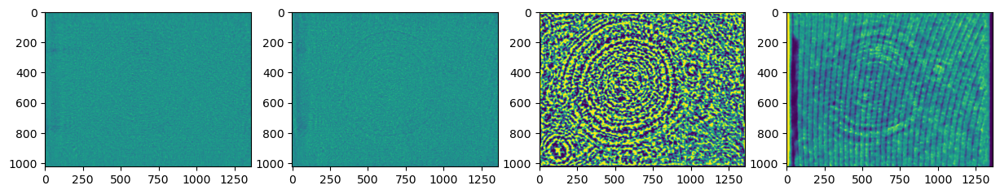

101 0.12906091349550516 155.0030059814453
102 0.1290922202908926 155.0030059814453
103 0.12898787820744204 155.0030059814453
104 0.12892970090587055 155.0030059814453
105 0.1289506850123977 155.0030059814453
106 0.13146325407005427 155.0030059814453
107 0.13379798350836236 155.0030059814453
108 0.1318160654051484 155.0030059814453
109 0.13078235243351377 155.0030059814453
110 0.13159632156320827 155.0030059814453


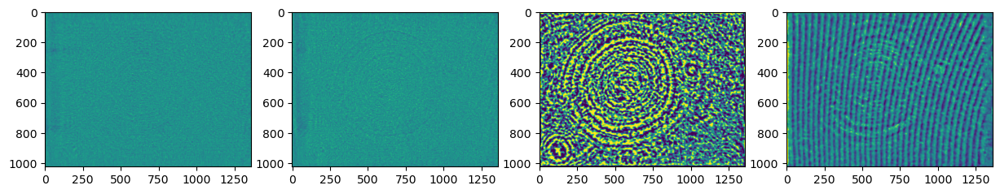

111 0.13106408179009438 155.0030059814453
112 0.13051884314433787 155.0030059814453
113 0.13049947653045735 155.0030059814453
114 0.1304481229651786 155.0030059814453
115 0.13029475392394044 155.0030059814453
116 0.130113107408612 155.0030059814453
117 0.13002346513905821 155.0030059814453
118 0.12993770454486098 155.0030059814453
119 0.12984502277270793 155.0030059814453
120 0.12974095354076387 155.0030059814453


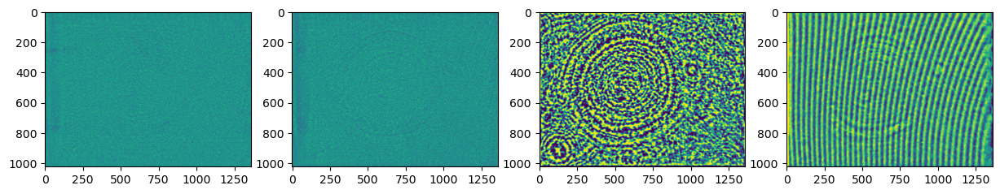

121 0.12965577653861976 155.0030059814453
122 0.12958259150653742 155.0030059814453
123 0.12954153803375248 155.0030059814453
124 0.1294868389562542 155.0030059814453
125 0.12942660169961392 155.0030059814453
126 0.12937304244436043 155.0030059814453
127 0.12933683686847544 155.0030059814453
128 0.12929489292901797 155.0030059814453
129 0.12925463148587168 155.0030059814453
130 0.12922279657305644 155.0030059814453


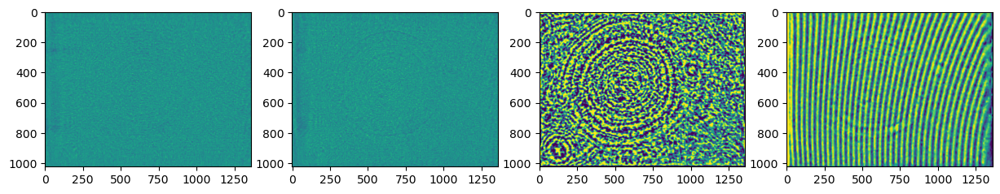

131 0.12919865336169056 155.0030059814453
132 0.12917017868837993 155.0030059814453
133 0.12915343995495843 155.0030059814453
134 0.12913139160231984 155.0030059814453
135 0.12911034643014455 155.0030059814453
136 0.12908757726886508 155.0030059814453
137 0.12906634541507592 155.0030059814453
138 0.12904734158928696 155.0030059814453
139 0.1290346970692316 155.0030059814453
140 0.12906342246272673 155.0030059814453


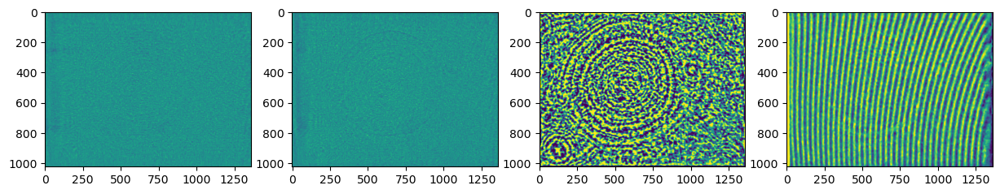

141 0.12922611117178653 155.0030059814453
142 0.1297109989719615 155.0030059814453
143 0.12919900594144607 155.0030059814453
144 0.12967411517329766 155.0030059814453
145 0.12942080948227094 155.0030059814453
146 0.12944220535692474 155.0030059814453
147 0.12928571591558408 155.0030059814453
148 0.12922980102646695 155.0030059814453
149 0.12925855289179317 155.0030059814453
150 0.1291868400105099 155.0030059814453


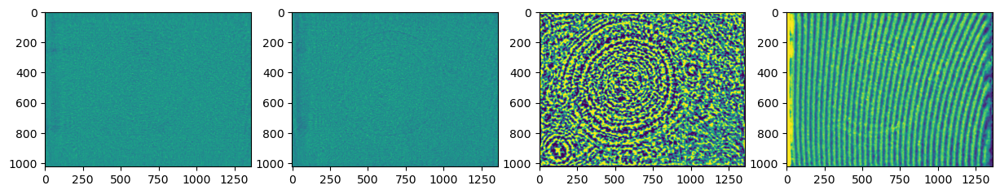

151 0.1292047531898201 155.0030059814453
152 0.12907860076294525 155.0030059814453
153 0.1290930397228991 155.0030059814453
154 0.1290332810093821 155.0030059814453
155 0.12900008926735776 155.0030059814453
156 0.12899669451174087 155.0030059814453
157 0.1289432407533197 155.0030059814453
158 0.12893736095726072 155.0030059814453
159 0.12892945405362466 155.0030059814453
160 0.1288746109047677 155.0030059814453


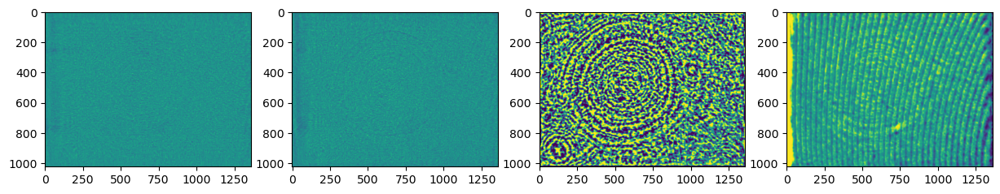

161 0.128861847394172 155.0030059814453
162 0.1288432845694204 155.0030059814453
163 0.12884029550663212 155.0030059814453
164 0.12881840841693157 155.0030059814453
165 0.12875605046622268 155.0030059814453
166 0.1287438199482972 155.0030059814453
167 0.12874325100347753 155.0030059814453
168 0.12870396132548734 155.0030059814453
169 0.12873162484336692 155.0030059814453
170 0.12871631395916452 155.0030059814453


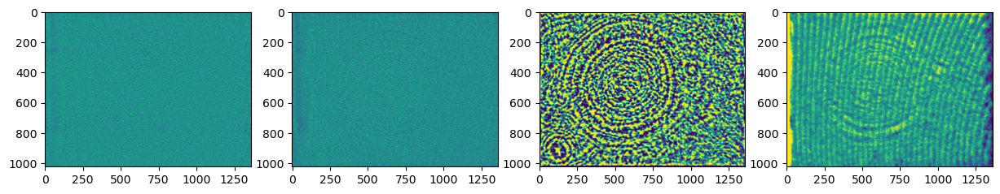

171 0.12872572718971056 155.0030059814453
172 0.12871351841058187 155.0030059814453
173 0.1287122843006333 155.0030059814453
174 0.12864890142775937 155.0030059814453
175 0.12863664022507532 155.0030059814453
176 0.1286236298933759 155.0030059814453
177 0.12858492199543173 155.0030059814453
178 0.12857663860520538 155.0030059814453
179 0.1285707548853498 155.0030059814453
180 0.12857030774943096 155.0030059814453


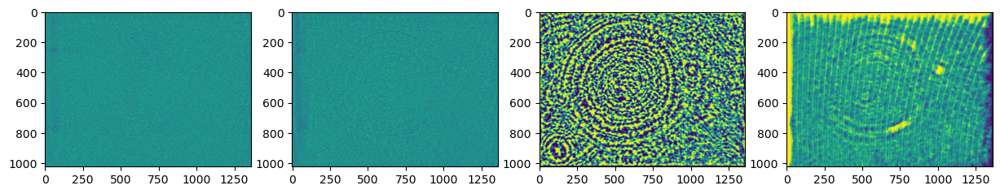

181 0.128615722086535 155.0030059814453
182 0.12869472278462563 155.0030059814453
183 0.1289424842396712 155.0030059814453
184 0.12864244648604242 155.0030059814453
185 0.1287848468053781 155.0030059814453
186 0.12914194547283714 155.0030059814453
187 0.12878451989830064 155.0030059814453
188 0.12926434231450523 155.0030059814453
189 0.12890014382824427 155.0030059814453
190 0.12907607277599548 155.0030059814453


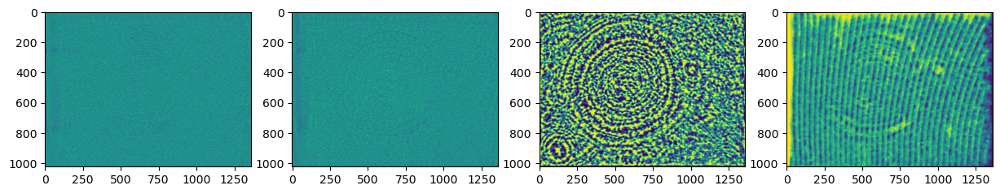

191 0.128789930044197 155.0030059814453
192 0.1289929360971784 155.0030059814453
193 0.1288991244065017 155.0030059814453
194 0.12893961380863733 155.0030059814453
195 0.1287812924470475 155.0030059814453
196 0.1287953154151722 155.0030059814453
197 0.12878878255439696 155.0030059814453
198 0.12877899230590562 155.0030059814453
199 0.1287578559389568 155.0030059814453
200 0.12866519330124673 155.0030059814453


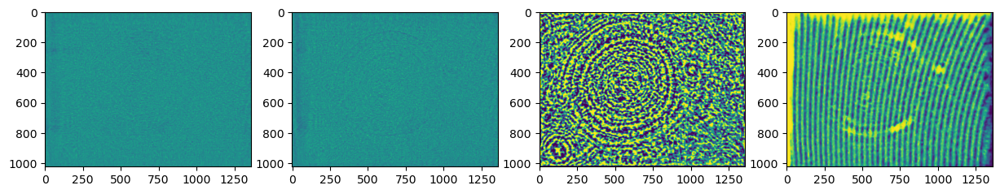

In [11]:
epochs = 201
loss_arr = []


for itr in range(epochs):

    optimizer.zero_grad()
    optimizer_proc.zero_grad()

    obj = obj_amp*torch.exp(1j*obj_phase)
    
    wave_phase = ((A)@coeffs).reshape(1024, 1360)
    wave = torch.exp(1j*wave_phase)
    
    wave_op = wave.to(device)*obj.to(device)

    wave_obj.wavefield(wave_op.T)
    dist = torch.tensor(155.003) # mm
    wave_at_img = wave_obj.propogate(dist).to(device).T

    # print(wave_at_img.size())

    wave_z_amp = torch.abs(wave_at_img).float()
    wave_z_phase = torch.angle(wave_at_img).float()
    # + cons

    wave_z_amp_proc = model_amp(wave_z_amp.unsqueeze(0).unsqueeze(0)).squeeze()
    wave_z_phase_proc = model_amp(wave_z_phase.unsqueeze(0).unsqueeze(0)).squeeze()

    # loss_proc = 0.9*l2_loss(proc, obj_phase) + total_variation_loss(proc, 0.1)
    
    loss_amp = loss_fn(wave_z_amp_proc, target_abs)
    loss_phase = loss_fn(wave_z_phase_proc, target_phase)
    # loss_amp = l2_loss(torch.abs(wave_at_img).float(), target_abs.float())

    loss = 0.5*loss_amp + 0.5*loss_phase + 0.1*l2_loss(wave_z_phase, wave_z_phase_proc) + 0.1*l2_loss(wave_z_amp, wave_z_amp_proc)
    # + total_variation_loss(obj_phase, 0.1) + total_variation_loss(obj_amp, 0.1) + 0.1*l2_loss(wave_z_amp, wave_z_amp_proc) + 0.1*l2_loss(wave_z_phase, wave_z_phase_proc)
    # + 1/(grad_x.ravel().abs().mean() + grad_y.ravel().abs().mean())

    # 

    loss.backward()
    # loss_proc.backward()
    
    optimizer.step()
    optimizer_proc.step()

    loss_arr.append(loss.item())
    print(itr, loss_arr[-1], dist.item(), 
        #   (grad_x.ravel().abs().mean() + grad_y.ravel().abs().mean()).abs().item()
          ) 

    if (itr) % 10 == 0:

        fig, axs = plt.subplots(1, 4, figsize=(15, 8))

        axs[0].imshow(obj_phase.cpu().detach())
        # axs[1].imshow(proc.detach())
        axs[1].imshow(obj_amp.cpu().detach())
        axs[2].imshow(wave_z_amp_proc.cpu().detach())
        axs[3].imshow(wave_z_phase_proc.cpu().detach())

        plt.show()

In [5]:
obj_amp.shape

torch.Size([1024, 1360])

In [15]:
dist, dist.grad, cons.grad, coeffs.grad, coeffs

(tensor(155.0030),
 None,
 tensor(6.1609e-05),
 tensor([[-3.0636e-05],
         [-2.0035e-06],
         [-4.0027e-06],
         [ 5.3502e-06],
         [ 2.9303e-06],
         [ 6.1610e-05],
         [-2.2012e-05],
         [-1.7115e-06],
         [-9.6100e-06],
         [-9.7818e-07]]),
 tensor([[ -13.6549],
         [-113.8291],
         [ -12.6690],
         [   2.6220],
         [   3.5425],
         [-126.7134],
         [   2.4341],
         [   2.0854],
         [   1.4879],
         [   4.0751]], requires_grad=True))

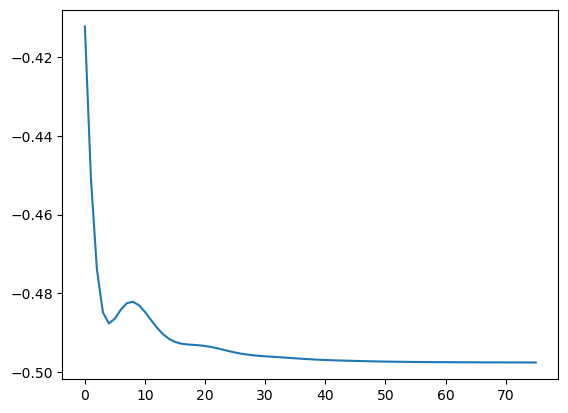

In [16]:
plt.plot(np.log10(loss_arr))

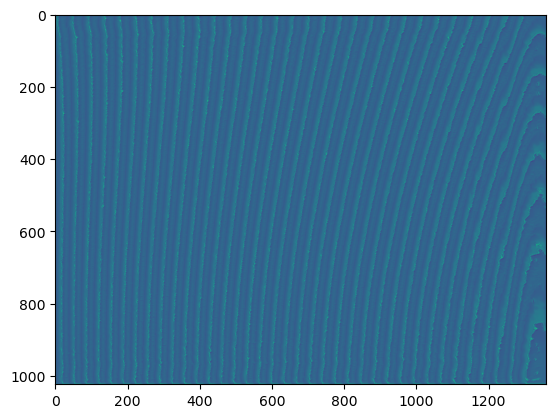

In [19]:
plt.imshow(wave_z_phase_proc.detach().T)

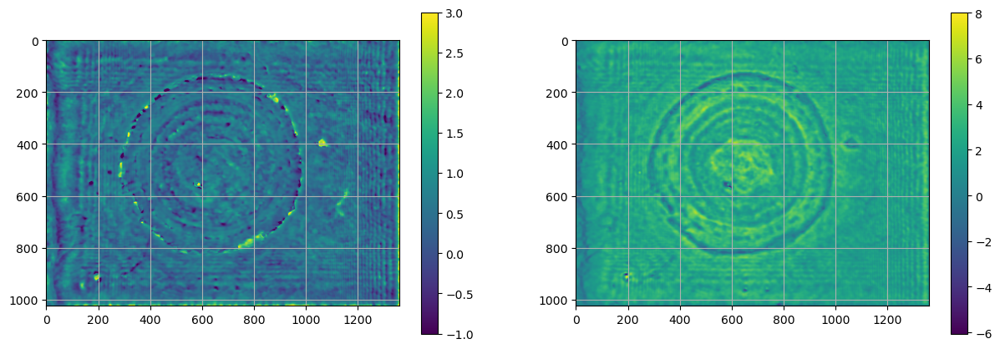

In [141]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.detach())
cm0 = axs[0].imshow(obj_phase.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()

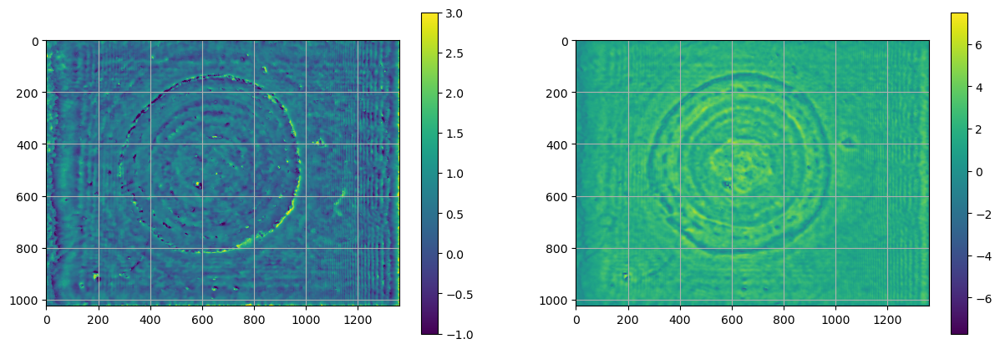

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.detach())
cm0 = axs[0].imshow(obj_phase.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()

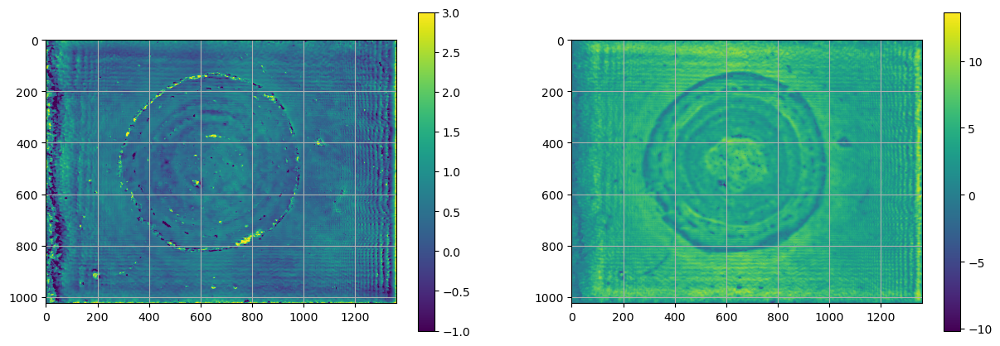

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.detach())
cm0 = axs[0].imshow(obj_phase.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()

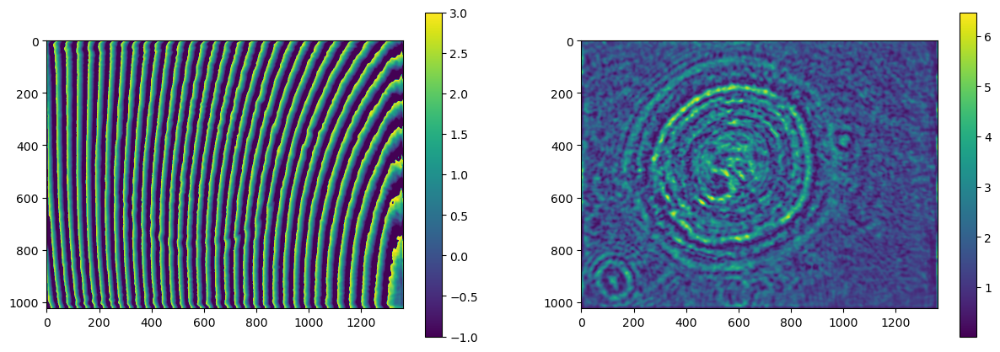

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

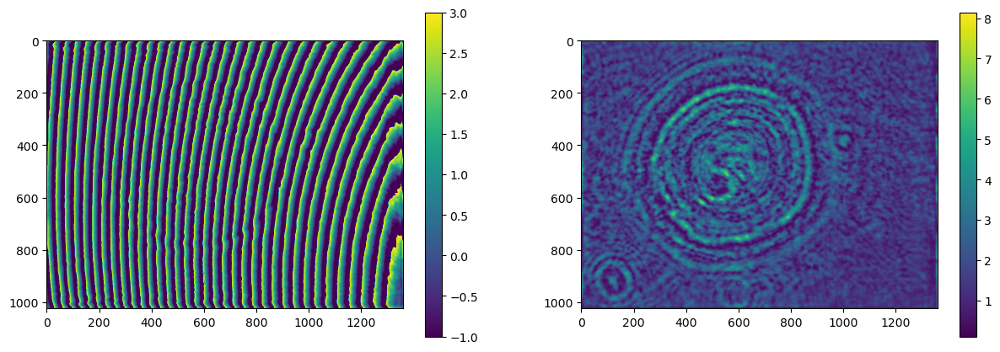

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

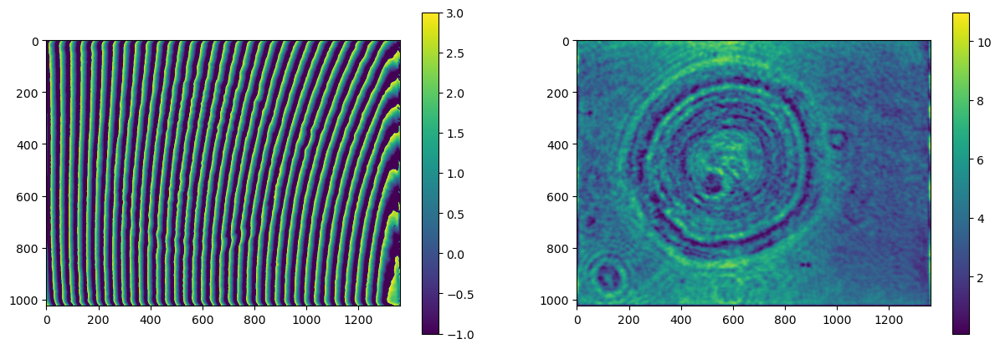

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

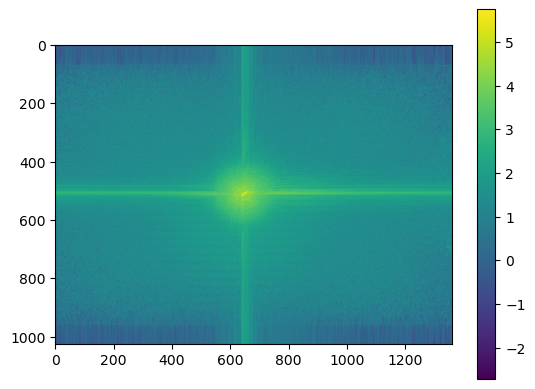

In [ ]:
plt.imshow(np.log10(torch.abs(torch.fft.fftshift(torch.fft.fft2(wave_at_img.detach())))).T)
plt.colorbar()

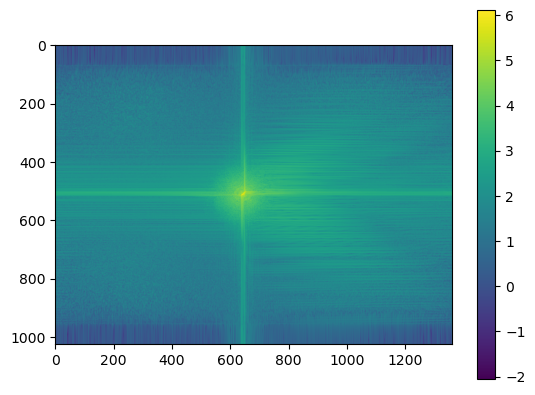

In [ ]:
plt.imshow(np.log10(torch.abs(torch.fft.fftshift(torch.fft.fft2(wave_at_img.detach())))).T)
plt.colorbar()

tensor([[ -12.7241],
        [-114.5435],
        [ -12.9551],
        [   4.7421],
        [   6.8633],
        [-118.1326],
        [   2.3889],
        [   2.4276],
        [   1.5576],
        [   3.9442]], requires_grad=True)

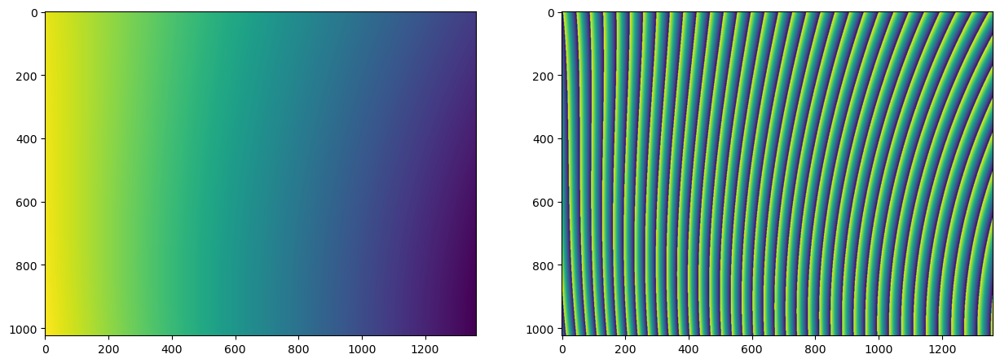

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

axs[1].imshow(torch.angle(wave).detach())
axs[0].imshow(wave_phase.detach())

coeffs

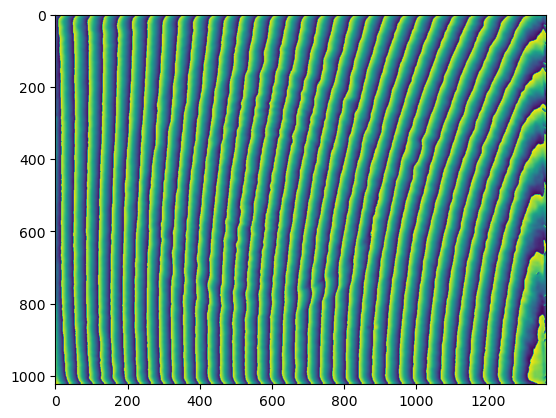

In [ ]:
plt.imshow(wave_z.detach().T)

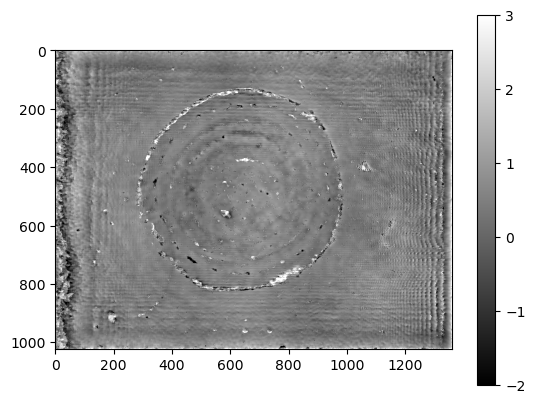

In [ ]:
plt.imshow((obj_phase.detach().numpy()), cmap='gray', vmin=-2, vmax=3)
plt.colorbar()